In [2]:
# control execution time of functions
import threading

TIMER = 120
PERMUT = 12

class TimeoutError(Exception):
    pass

class InterruptableThread(threading.Thread):
    def __init__(self, func, *args, **kwargs):
        threading.Thread.__init__(self)
        self._func = func
        self._args = args
        self._kwargs = kwargs
        self._result = None

    def run(self):
        self._result = self._func(*self._args, **self._kwargs)

    @property
    def result(self):
        return self._result


class timeout(object):
    def __init__(self, sec):
        self._sec = sec

    def __call__(self, f):
        def wrapped_f(*args, **kwargs):
            it = InterruptableThread(f, *args, **kwargs)
            it.start()
            it.join(self._sec)
            if not it.is_alive():
                return it.result
            raise TimeoutError('execution expired')
        return wrapped_f

In [3]:
import numpy as np
import pandas as pd
import os
import time
import logging
import json
from scipy.spatial.distance import pdist, squareform
from sklearn.metrics import silhouette_score, adjusted_mutual_info_score
from st_clustering import ST_DBSCAN, ST_Agglomerative, ST_KMeans, ST_SpectralClustering, ST_AffinityPropagation, ST_BIRCH, ST_HDBSCAN, ST_OPTICS
from TKM_long_term_clusters import score_predicted_assignments




In [4]:
class Test(object):       
    # use this function with st clusterers
#     @timeout(TIMER) # set seconds for timeout
    def frame_split_cluster(self, algorithm, data, frame_size, frame_overlap):
        t,n, m_plus = data.shape
        st_data = data.reshape(t*n, m_plus)
        start_time = time.time()
        algorithm.st_fit_frame_split(st_data, frame_size, frame_overlap)
        runtime = time.time() - start_time
        weights = algorithm.labels.reshape((t,n)).T
        
        ind_i,ind_j = np.where(weights == -99)

        current = k

        for i in ind_i:
            for j in ind_j:
                weights[i][j] = current
                current +=1

        long_term_ami, full_ami = score_predicted_assignments(weights, k, true_labels)
#         full_ami = adjusted_mutual_info_score(np.tile(true_labels, t), algorithm.labels)
#         ami = adjusted_mutual_info_score(labels, algorithm.labels)
        return long_term_ami, full_ami, runtime
    
    def fit_cluster(self, algorithm, data):
        t,n, m_plus = data.shape
        st_data = data.reshape(t*n, m_plus)
        start_time = time.time()
        algorithm.st_fit(st_data)
        runtime = time.time() - start_time
        weights = algorithm.labels.reshape((t,n)).T
        long_term_ami, full_ami = score_predicted_assignments(weights, k, true_labels)
        
        return long_term_ami, full_ami, runtime


    def frame_split_cluster_fill_out(self, algorithm, data, frame_size, frame_overlap, t_full):
        t,n, m_plus = data.shape
        st_data = data.reshape(t*n, m_plus)
        start_time = time.time()
        algorithm.st_fit_frame_split(st_data, frame_size, frame_overlap)
        runtime = time.time() - start_time
        weights = algorithm.labels.reshape((t,n)).T
        assignments = fill_out_predictions(weights, t_full)
        long_term_ami, full_ami = score_predicted_assignments(assignments, k, true_labels)
#         full_ami = adjusted_mutual_info_score(np.tile(true_labels, t), algorithm.labels)
#         ami = adjusted_mutual_info_score(labels, algorithm.labels)
        return long_term_ami, full_ami, runtime
        
    # use this with trajectory clustering
    @timeout(TIMER)
    def traj_cluster(self,algorithm, data):
        start_time = time.time()
        algorithm.st_fit(data)
        runtime = time.time() - start_time
        ami = adjusted_mutual_info_score(algorithm.true_labels, algorithm.labels)
        return ami, runtime
        
    # use this with dbscan2
    @timeout(TIMER)
    def cluster(self, algorithm, data):
        start_time = time.time()
        algorithm.st_fit(data)
        runtime = time.time() - start_time
        ami = adjusted_mutual_info_score(labels, algorithm.labels)
        return ami, runtime

In [ ]:
import pandas as pd
table = pd.read_csv('dataset_sizes')
table.head()

FRAME_SIZE = 100
FRAME_OVERLAP = 10

sizes = [15000,20000,25000]#, 25000, 35000] #[15000, 20000, 25000, 35000]#, 6000]#, 10000, 15000, 20000, 25000] #[10000, 15000] #[20000, 25000, 35000]#, 50000, 80000, 100000, 130000, 150000, 180000, 200000]
# methods = ['agglomerative', 'birch', 'kmeans']#, 'hdbscan']# 'dbscan_baseline'] #'dbscan' has to be run w .05, 
methods = ['dbscan_baseline']
eps1 = .05
alpha = 1.0

# subset_option = False

for ind in range(len(sizes) -1):
    min_size = sizes[ind]
    max_size = sizes[ind+1]
    
    table_min_max = table[(table[' data size ']>=min_size) & (table[' data size ']<max_size)]
    
    tot_entries = len(table_min_max)

    for method in methods: 
        entry_count = 0
        alpha_val = int(alpha*10)
        
        metric = 'static'#'average_ami'

        f = open(method + 'sc_removenoise_' + metric + "_log_%d_%d_0%d.txt" %(min_size, max_size, alpha_val), "w")
        lt_ami =[]
        full_ami_list = []
        runtime_list=[]

        for filename in table_min_max['filename']:
            entry_count +=1

            # read data
            if filename.endswith(".csv"):

                df = pd.read_csv('full_data/'+filename)

                dataset_size = df['id'].nunique()*df['frame'].nunique()

                if dataset_size in range(min_size, max_size):

                    df['x'] = (df['x'] - df['x'].min()) / (df['x'].max() - df['x'].min())
                    df['y'] = (df['y'] - df['y'].min()) / (df['y'].max() - df['y'].min())
                    # transform to numpy array
                #     data = df.loc[:, ['frame','x','y']].values
                #     labels = df['cid'].to_numpy()


                    frame_positions = []

                    for frame in df['frame'].unique():
                        frame_data = df[df['frame'] == frame]

                        n_id = frame_data['id'].nunique()

                        frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()

                        frame_data.sort_values(["id_cumcounts", "id"], inplace=True)

                        frame_positions.append(frame_data[['frame', 'x', 'y']].to_numpy()[:n_id])

                # # transform to numpy array
                    try:

                        data = np.array(frame_positions)
                        t,n, m_plus = data.shape
                        st_data = data.reshape(t*n, m_plus)

                        true_labels = frame_data['cid'].to_list()[:n_id]
                        full_labels = np.tile(true_labels, t)

                        k = len(np.unique(true_labels))
                        
#                         if subset_option is True:
#                             t_full = t
#                             t = range(0,t_full,10)
                            
#                             data = data[t,:,:]
                            

                    except:
                        continue
                        
                    
                    
                    test = Test()
                    eps2 = alpha*t
                                        
#                     # grid search
#                     param_dict_dbscan = {'eps1': [0.02, 0.03, 0.04, 0.05],'eps2':[5, 25, 50, 100], 'min_samples': [2]}
#                     param_dict_agglo = {'eps2':[5, 25, 50, 100], 'n_clusters': [k]}
#                     param_dict_kmeans = {'eps2':[5, 25, 50, 100], 'n_clusters': [k]}
#                     # param_dict_optics = {'eps2':[5, 15, 25], 'min_cluster_size': [2], 'min_samples' : [2]}
#                     # param_dict_spectral = {'eps2':[5, 15, 25], 'n_clusters': [n_cluster]}
#                     # param_dict_affinity = {'eps2':[5, 15, 25]}
#                     param_dict_birch = {'eps2':[5, 25, 50, 100], 'threshold': [0.3, 0.5], 'n_clusters': [k]}
#         #             param_dict_hdbscan = {'eps2':[5, 25, 50, 100], 'min_cluster_size': [k], 'min_samples': [2]}
#                     ## ---
                    
                    
                    if method == 'dbscan_baseline':
                        print('running dbscan baseline')
                        try:
#                             opt_param_dbscan = st_grid_search(estimator=ST_DBSCAN, split=True, X=data, param_dict=param_dict_dbscan, metric=metric, n_clusters = k, y=true_labels, frame_size=FRAME_SIZE, frame_overlap=FRAME_OVERLAP)
                            opt_param_dbscan = {'eps1':eps1, 'eps2': eps2, 'min_samples': 2}
                            dbscan = ST_DBSCAN(**opt_param_dbscan)
#                             if subset_option is True:
#                                 ami, full_ami, runtime = test.frame_split_cluster_fill_out(dbscan, data, FRAME_SIZE, FRAME_OVERLAP, t_full)
#                             else:
                            ami, full_ami, runtime = test.fit_cluster(dbscan, data)
                            lt_ami.append(ami)
                            full_ami_list.append(full_ami)
                            runtime_list.append(runtime)
                            f.write(filename + ' ami: %f full_ami; %f runtime: %f \n\n' %(ami, full_ami, runtime))


                            print(entry_count, '/', tot_entries, 'running average', np.average(lt_ami), np.average(full_ami_list), np.average(runtime_list), '\n')

                #             logging.info('dataset: {}, method: {}, ami: {}, execution time: {}'.format(filename, dbscan, ami, runtime))
                        except TimeoutError:
                            print('timeout')
                #             logging.info('TimeoutError! dataset: {}, method: {}'.format(filename, 'DBSCAN'))
                            not_timed_out_dbscan = False
                            pass
#                         except:
#                             print('other error')
#                 #             logging.info('ComputationalError! dataset: {}, method: {}'.format(filename, 'DBSCAN'))
#                             pass


    
                    if method == 'dbscan':
                        print('running dbscan')
                        try:
#                             opt_param_dbscan = st_grid_search(estimator=ST_DBSCAN, split=True, X=data, param_dict=param_dict_dbscan, metric=metric, n_clusters = k, y=true_labels, frame_size=FRAME_SIZE, frame_overlap=FRAME_OVERLAP)
                            opt_param_dbscan = {'eps1':eps1, 'eps2': eps2, 'min_samples': 2}
                            dbscan = ST_DBSCAN(**opt_param_dbscan)
#                             if subset_option is True:
#                                 ami, full_ami, runtime = test.frame_split_cluster_fill_out(dbscan, data, FRAME_SIZE, FRAME_OVERLAP, t_full)
#                             else:
                            ami, full_ami, runtime = test.frame_split_cluster(dbscan, data, FRAME_SIZE, FRAME_OVERLAP)
                            print(ami, full_ami, runtime)
                            lt_ami.append(ami)
                            full_ami_list.append(full_ami)
                            runtime_list.append(runtime)
                            f.write(filename + ' ami: %f full_ami; %f runtime: %f \n\n' %(ami, full_ami, runtime))


                            print(entry_count, '/', tot_entries, 'running average', np.average(lt_ami), np.average(full_ami_list), np.average(runtime_list), '\n')

                #             logging.info('dataset: {}, method: {}, ami: {}, execution time: {}'.format(filename, dbscan, ami, runtime))
                        except TimeoutError:
                            print('timeout')
                #             logging.info('TimeoutError! dataset: {}, method: {}'.format(filename, 'DBSCAN'))
                            not_timed_out_dbscan = False
                            pass
#                         except:
#                             print('other error')
#                 #             logging.info('ComputationalError! dataset: {}, method: {}'.format(filename, 'DBSCAN'))
#                             pass


                    ## ST_Agglomerative 
                    if method == 'agglomerative':
                        print('running agglomerative')
                        try:
#                             opt_param_agglo = st_grid_search(estimator=ST_Agglomerative, split=True, X=data, param_dict=param_dict_agglo, metric=metric, n_clusters = k, y=true_labels, frame_size=FRAME_SIZE, frame_overlap=FRAME_OVERLAP)
                            opt_param_agglo = {'eps1': eps1, 'eps2': eps2, 'n_clusters': k}
                            print(opt_param_agglo)
                            agglo = ST_Agglomerative(**opt_param_agglo)
                            ami, full_ami, runtime = test.frame_split_cluster(agglo, data, FRAME_SIZE, FRAME_OVERLAP)
                            lt_ami.append(ami)
                            full_ami_list.append(full_ami)
                            runtime_list.append(runtime)

                            f.write(filename + ' ami: %f full_ami: %f runtime: %f \n\n' %(ami, full_ami, runtime))

                            print(entry_count, '/', tot_entries, 'running average', np.average(lt_ami), np.average(full_ami_list), np.average(runtime_list), '\n')
                #             logging.info('dataset: {}, method: {}, ami: {}, execution time: {}'.format(filename, agglo, ami, runtime))
                        except TimeoutError:
                            print('timeout')
                #             logging.info('TimeoutError! dataset: {}, method: {}'.format(filename, 'Agglomerative'))
                            not_timed_out_agglo = False
                            pass
                        except:
                            print('other error')
                #             logging.info('ComputationalError! dataset: {}, method: {}'.format(filename, 'Agglomerative'))
                            pass

                    ## K-MEANS
                    if method == 'kmeans':
                        print('running kmeans')
                        try:
#                             opt_param_kmeans = st_grid_search(estimator=ST_KMeans, split=True, X=data, param_dict=param_dict_kmeans, metric=metric, n_clusters = k, y=true_labels, frame_size=FRAME_SIZE, frame_overlap=FRAME_OVERLAP)
                            opt_param_kmeans = {'eps1': eps1, 'eps2': eps2, 'n_clusters': k}
                            kmeans = ST_KMeans(**opt_param_kmeans)
                            ami, full_ami, runtime = test.frame_split_cluster(kmeans, data, FRAME_SIZE, FRAME_OVERLAP)
                            lt_ami.append(ami)
                            full_ami_list.append(full_ami)
                            runtime_list.append(runtime)
                            f.write(filename + ' ami: %f full_ami: %f runtime: %f \n\n' %(ami, full_ami, runtime))

                            print(entry_count, '/', tot_entries, 'running average', np.average(lt_ami), np.average(full_ami_list), np.average(runtime_list), '\n')

            #logging.info('dataset: {}, method: {}, ami: {}, execution time: {}'.format(filename, kmeans, ami, runtime))
                        except TimeoutError:
                            print('timeout')
                            logging.info('TimeoutError! dataset: {}, method: {}'.format(filename, 'KMeans'))
                            not_timed_out_kmeans = False
                            pass
#                         except:
#                             print('other error')
#             #                 logging.info('ComputationalError! dataset: {}, method: {}'.format(filename, 'KMeans'))
#                             pass


                    ## BIRCH
                    if method == 'birch':
                        try:
#                             opt_param_birch = st_grid_search(estimator=ST_BIRCH, split=True, X=data, param_dict=param_dict_birch, metric=metric, n_clusters = k, y=true_labels, frame_size=FRAME_SIZE, frame_overlap=FRAME_OVERLAP)
                            opt_param_birch = {'eps1':eps1, 'eps2': eps2, 'n_clusters': k}
                            birch = ST_BIRCH(**opt_param_birch)
                            ami, full_ami, runtime = test.frame_split_cluster(birch, data, FRAME_SIZE, FRAME_OVERLAP)

                            lt_ami.append(ami)
                            full_ami_list.append(full_ami)
                            runtime_list.append(runtime)
                            f.write(filename + ' ami: %f full_ami: %f runtime: %f \n\n' %(ami, full_ami, runtime))

                            print(entry_count, '/', tot_entries, 'running average', np.average(lt_ami), np.average(full_ami_list), np.average(runtime_list), '\n')

                        except TimeoutError:
            #                 logging.info('TimeoutError! dataset: {}, method: {}'.format(filename, 'BIRCH'))
                            not_timed_out_birch = False
                            pass
                        except:
            #                 logging.info('ComputationalError! dataset: {}, method: {}'.format(filename, 'BIRCH'))
                            pass


                    ## HDBSCAN 
                    if method =='hdbscan':
                        try:
#                             opt_param_hdbscan = st_grid_search(estimator=ST_HDBSCAN, split=True, X=data, param_dict=param_dict_birch, metric=metric, n_clusters=k, y=true_labels, frame_size=FRAME_SIZE, frame_overlap=FRAME_OVERLAP)
                            opt_param_hdbscan = {'eps2': eps2, 'eps1': eps1, 'min_cluster_size': k}
#                             opt_param_hdbscan = {'eps2': 5, 'eps1': 0.5, 'n_clusters': 2}
                            hdbscan = ST_HDBSCAN(**opt_param_hdbscan)
                            ami, full_ami, runtime = test.frame_split_cluster(hdbscan, data, FRAME_SIZE, FRAME_OVERLAP)

                            lt_ami.append(ami)
                            full_ami_list.append(full_ami)
                            runtime_list.append(runtime)
                            f.write(filename + ' ami: %f full_ami: %f runtime: %f \n\n' %(ami, full_ami, runtime))

                            print(entry_count, '/', tot_entries, 'running average', np.average(lt_ami), np.average(full_ami_list), np.average(runtime_list), '\n')

                        except TimeoutError:
                            not_timed_out_hdbscan = False
                            pass 
                        except:
                            print('other error')
                            pass
            
        ami_average = np.average(lt_ami)
        full_ami_average = np.average(full_ami_list)
        runtime_average = np.average(runtime_list)
        f.write('ami average: %f full ami average: %f runtime average: %f' %(ami_average, full_ami_average, runtime_average))
        f.close()


            ## OPTICS 
            # if not_timed_out_optics:
            #     try:
            #         opt_param_optics = st_grid_search(estimator=ST_OPTICS, split=True, X=data, param_dict=param_dict_optics, metric='ami', y=labels, frame_size=FRAME_SIZE, frame_overlap=FRAME_OVERLAP)
            #         optics = ST_OPTICS(**opt_param_optics)
            #         ami, runtime = t.frame_split_cluster(optics, data, FRAME_SIZE, FRAME_OVERLAP)
            #         logging.info('dataset: {}, method: {}, ami: {}, execution time: {}'.format(filename, optics, ami, runtime))
            #     except TimeoutError:
            #         logging.info('TimeoutError! dataset: {}, method: {}'.format(filename, 'OPTICS'))
            #         not_timed_out_optics = False
            #         pass
            #     except:
            #         logging.info('ComputationalError! dataset: {}, method: {}'.format(filename, 'OPTICS'))
            #         pass

            ## SPECTRAL 
            # if not_timed_out_spectral:
            #     try:
            #         opt_param_spectral = st_grid_search(estimator=ST_SpectralClustering, split=True, X=data, param_dict=param_dict_spectral, metric='ami', y=labels, frame_size=FRAME_SIZE, frame_overlap=FRAME_OVERLAP)
            #         spectral = ST_SpectralClustering(**opt_param_spectral)
            #         ami, runtime = t.frame_split_cluster(spectral, data, FRAME_SIZE,FRAME_OVERLAP)
            #         logging.info('dataset: {}, method: {}, ami: {}, execution time: {}'.format(filename, spectral, ami, runtime))
            #     except TimeoutError:
            #         logging.info('TimeoutError! dataset: {}, method: {}'.format(filename, 'Spectral'))
            #         not_timed_out_spectral = False
            #         pass
            #     except:
            #         logging.info('ComputationalError! dataset: {}, method: {}'.format(filename, 'Spectral'))
            #         pass

            ## AFFINITY 
            # if not_timed_out_affinity:
            #     try:
            #         opt_param_affinity = st_grid_search(estimator=ST_AffinityPropagation, split=True, X=data, param_dict=param_dict_affinity, metric='ami', y=labels, frame_size=FRAME_SIZE, frame_overlap=FRAME_OVERLAP)
            #         affinity = ST_AffinityPropagation(**opt_param_affinity)
            #         ami, runtime = t.frame_split_cluster(affinity, data, FRAME_SIZE, FRAME_OVERLAP)
            #         logging.info('dataset: {}, method: {}, ami: {}, execution time: {}'.format(filename, affinity,  ami, runtime))
            #     except TimeoutError:
            #         logging.info('TimeoutError! dataset: {}, method: {}'.format(filename, 'Affinity'))
            #         not_timed_out_affinity = False
            #         pass
            #     except:
            #         logging.info('ComputationalError! dataset: {}, method: {}'.format(filename, 'Affinity'))
            #         pass

/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
1 / 148 running average 1.0 1.0 28.80805230140686 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
2 / 148 running average 1.0 1.0 21.282654643058777 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
3 / 148 running average 1.0 1.000000000000001 25.47734236717224 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
4 / 148 running average 0.7960780972639714 0.7500000000000009 20.979423761367798 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
5 / 148 running average 0.676149511927673 0.6000000000000008 18.61548900604248 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
6 / 148 running average 0.5698586638132516 0.5000000000000006 16.916241367657978 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
7 / 148 running average 0.631307426125644 0.571428571428573 18.241978883743286 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
8 / 148 running average 0.5865921935133239 0.5000000000000013 17.28116026520729 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
9 / 148 running average 0.5253255743094869 0.44444444444444564 17.020729541778564 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
10 / 148 running average 0.48279577339282387 0.4000000000000011 15.949916195869445 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
11 / 148 running average 0.5298143394480217 0.45454545454545553 16.444818344983187 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
12 / 148 running average 0.5689964778273532 0.5000000000000009 16.637133141358692 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
13 / 148 running average 0.557307120342124 0.46153846153846234 15.842818516951342 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
14 / 148 running average 0.5127455633498644 0.4285714285714293 15.536277839115687 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
15 / 148 running average 0.4905221618374519 0.4000000000000007 14.973786004384358 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
16 / 148 running average 0.5223645267226111 0.4375000000000008 14.53269937634468 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
17 / 148 running average 0.5504607310330458 0.47058823529411836 14.092671843136058 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
18 / 148 running average 0.5754351348645432 0.5000000000000007 13.706372062365213 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
19 / 148 running average 0.5977806540821988 0.5263157894736852 13.31349095545317 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
20 / 148 running average 0.617891621378089 0.5500000000000009 13.838865900039673 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
21 / 148 running average 0.587025283762252 0.5238095238095246 13.737869728179206 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
22 / 148 running average 0.55697206491559 0.5000000000000008 13.423614155162465 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
23 / 148 running average 0.5337120901267752 0.4782608695652182 13.667082320088925 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
24 / 148 running average 0.5531407530381597 0.5000000000000008 13.548045764366785 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
25 / 148 running average 0.5710151229166333 0.5200000000000007 13.291891899108887 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
26 / 148 running average 0.5546309130963378 0.5000000000000007 13.37566077709198 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
27 / 148 running average 0.5371459626070474 0.4814814814814821 13.175195782272905 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
28 / 148 running average 0.5172070143184156 0.4642857142857149 12.977641352585383 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
29 / 148 running average 0.49813263556903864 0.44827586206896614 13.227222195987043 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
30 / 148 running average 0.4919397721841809 0.4333333333333339 13.060346722602844 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
31 / 148 running average 0.4792853485191943 0.419354838709678 13.103382602814705 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
32 / 148 running average 0.4744008076920145 0.40625000000000056 12.977154426276684 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
33 / 148 running average 0.4610995086460086 0.3939393939393945 12.794208331541581 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
34 / 148 running average 0.4465572879378632 0.3823529411764711 12.866588641615476 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
35 / 148 running average 0.43682037551029984 0.37142857142857194 12.924734824044364 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
36 / 148 running average 0.4316828413257487 0.3611111111111116 13.03278249502182 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
37 / 148 running average 0.42108108665680416 0.3513513513513518 12.881125482353005 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
38 / 148 running average 0.4091581778398154 0.3421052631578952 12.871966863933363 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
39 / 148 running average 0.424307968151615 0.3333333333333338 12.949338148801754 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
40 / 148 running average 0.4387002689478246 0.349468248715147 12.825480645895004 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
41 / 148 running average 0.43159225542572405 0.34094463289282634 12.793521340300398 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
42 / 148 running average 0.42079720371021817 0.33282690353823524 12.795101829937526 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
43 / 148 running average 0.4342670361820736 0.34834255694432276 12.71009506181229 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
44 / 148 running average 0.4237448009209951 0.3404256806501336 12.595467670397325 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
45 / 148 running average 0.41754967120631026 0.3328606655245751 12.632338656319511 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
46 / 148 running average 0.40932781849224237 0.3256245641001278 12.50445013979207 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
47 / 148 running average 0.40441440889022956 0.3186963818852315 12.409954136990486 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
48 / 148 running average 0.39618079575489523 0.31205687392928916 12.296938846508661 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
49 / 148 running average 0.38783199325634193 0.30568836629807916 12.408896115361427 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
50 / 148 running average 0.3798586838713465 0.2995745989721176 12.54740451335907 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
51 / 148 running average 0.392018317520928 0.3133084303648212 12.540082992291918 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
52 / 148 running average 0.38423882991887154 0.3072832682424208 12.456813358343565 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
53 / 148 running average 0.3958569652034211 0.32035339525671475 12.354722684284425 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
54 / 148 running average 0.3885944924032022 0.314420924974183 12.452813801942048 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
55 / 148 running average 0.38074910218063907 0.3087041808837433 12.496095262874256 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
56 / 148 running average 0.3750826711290558 0.3031916062251051 12.420277897800718 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
57 / 148 running average 0.36893704335545896 0.29787245523869976 12.416673781579 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
58 / 148 running average 0.3644974827405073 0.2927367232518256 12.372848132560993 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
59 / 148 running average 0.37526871184660043 0.3047242364170489 12.436517214370987 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
60 / 148 running average 0.37372683045836125 0.2996454991434314 12.419754433631898 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
61 / 148 running average 0.36740876070137785 0.2947332778459981 12.410306918816488 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
62 / 148 running average 0.36180954370297613 0.2899795153000949 12.316842602145288 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
63 / 148 running average 0.3575088066837127 0.28537666585088706 12.343188702114045 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
64 / 148 running average 0.3548073962343169 0.28091765544696695 12.388726938515902 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
65 / 148 running average 0.3494318050536452 0.27659584536316745 12.322958080585186 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
66 / 148 running average 0.34407728177434493 0.2724049992213013 12.332178263953239 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
67 / 148 running average 0.35386717309114574 0.2832646260985953 12.250349393531458 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
68 / 148 running average 0.3547482566275807 0.2790989698324395 12.328857285134932 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
69 / 148 running average 0.3487972950920515 0.27505405722617227 12.372761684915293 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
70 / 148 running average 0.35810019087645073 0.27112471355151263 12.305667117663793 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
71 / 148 running average 0.3533838510136759 0.26730605561416737 12.236580801681734 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
72 / 148 running average 0.3493371084362421 0.26359347150841506 12.171937316656113 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
73 / 148 running average 0.34559205720056374 0.25998260203569706 12.201098860126653 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
74 / 148 running average 0.3414710964884781 0.25646932362980923 12.189985967971182 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
75 / 148 running average 0.3491769660676798 0.2656825190145315 12.236319023768107 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
76 / 148 running average 0.34718484782012493 0.26218669639591924 12.3306637218124 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
77 / 148 running average 0.3438930910550411 0.25878167436480337 12.414267112682392 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
78 / 148 running average 0.3392748643705228 0.25546396059089566 12.44727731668032 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
79 / 148 running average 0.3335349114048287 0.25223023957075774 12.446139552925207 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
80 / 148 running average 0.33106951713709953 0.2490773615761232 12.399200606346131 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
81 / 148 running average 0.33932791816009833 0.2583480114332082 12.337731811735365 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
82 / 148 running average 0.347384894767902 0.2673925478791446 12.469494412585002 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
83 / 148 running average 0.3552477273610598 0.2762191436878297 12.646616395697537 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
84 / 148 running average 0.35076578981026235 0.27293082054868884 12.700512440431686 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
85 / 148 running average 0.34759465183901195 0.26971986971870426 12.718416659972247 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
86 / 148 running average 0.34784569289564066 0.26658359216383565 12.648627220198165 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
87 / 148 running average 0.35534171941408155 0.2750136658171249 12.746345435065784 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
88 / 148 running average 0.3544905423087603 0.2718885105237485 12.768211305141449 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
89 / 148 running average 0.36116308660629737 0.2797576408399898 12.881965953312562 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
90 / 148 running average 0.3564065674249327 0.27664922260843433 12.826823767026266 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
91 / 148 running average 0.353488018075618 0.2736091212610889 12.839024714061193 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
92 / 148 running average 0.3495783458520291 0.2706351090734683 12.783396054869113 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
93 / 148 running average 0.34734368201841614 0.2677305867003645 12.723850698881252 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
94 / 148 running average 0.3440304536156932 0.2648855678835557 12.740762713107657 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
95 / 148 running average 0.3427038078048116 0.26209729874793936 12.757705199091058 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
96 / 148 running average 0.3384464885565455 0.2593671185526483 12.697888530790806 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
97 / 148 running average 0.3344351152166169 0.25669323073251793 12.695400422381372 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
98 / 148 running average 0.3412265936327739 0.2642779936842269 12.79368693731269 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
99 / 148 running average 0.3374636946108955 0.2616085190005479 12.84716917047597 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
100 / 148 running average 0.34408905766478654 0.2689924338105424 12.79950726032257 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
101 / 148 running average 0.34054690791422043 0.2663291423866756 12.810300919088986 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
102 / 148 running average 0.33677233183941685 0.2637180723632768 12.77264802829892 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
103 / 148 running average 0.3335208848359115 0.26115770272868194 12.759145252912948 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
104 / 148 running average 0.3312402359639813 0.25864657097167537 12.715340557006689 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
105 / 148 running average 0.3286429416221092 0.25618327029575466 12.656404647373018 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
106 / 148 running average 0.3338222013642301 0.26229996805075856 12.609700115221852 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
107 / 148 running average 0.3317576331677114 0.2598485664801907 12.548506115084496 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
108 / 148 running average 0.3379450624902326 0.266701820494263 12.626240494074645 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
109 / 148 running average 0.34373276056691215 0.273367154052401 12.5999646383688 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
110 / 148 running average 0.3403216542962516 0.27088199810647007 12.639422408017245 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
111 / 148 running average 0.3385646746212286 0.2684416197451505 12.64992727030505 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
112 / 148 running average 0.336760032017177 0.26604481956885445 12.702538892626762 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
113 / 148 running average 0.34262941226481264 0.27253999815674074 12.662441327508573 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
114 / 148 running average 0.3483958209291564 0.2789212262430851 12.73651547390118 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
115 / 148 running average 0.3455575324408407 0.2764958242757539 12.696581564778867 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
116 / 148 running average 0.34159426561014977 0.27411185358525236 12.654601031336291 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
117 / 148 running average 0.33872306967926785 0.27176901722982283 12.617211553785536 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
118 / 148 running average 0.3441058626035668 0.2777565876862328 12.620920922796605 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
119 / 148 running average 0.34961757804387295 0.28382586005861743 12.573136025116224 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
120 / 148 running average 0.3471636614356408 0.2814606445581289 12.57439932624499 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
121 / 148 running average 0.3525590030766686 0.28739898633864025 12.528721697074323 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
122 / 148 running average 0.35095697350321337 0.2850533139701633 12.486173330760392 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
123 / 148 running average 0.34758842357182934 0.28273580735251974 12.478720849122459 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
124 / 148 running average 0.35284980725270165 0.28852019600290263 12.546165672040754 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
125 / 148 running average 0.3497137955599645 0.2862120344348794 12.504353090286255 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
126 / 148 running average 0.3548747971825045 0.2918770182885708 12.470987876256308 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
127 / 148 running average 0.3553699087701781 0.28957877405007815 12.433306348605418 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
128 / 148 running average 0.35971567833789553 0.29470693734773834 12.464330416172743 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
129 / 148 running average 0.35805876881641 0.2924223874458179 12.494769504828046 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
130 / 148 running average 0.35587472441824125 0.29017298446546547 12.50502036168025 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
131 / 148 running average 0.3599495181094057 0.29501946303310844 12.46490042082226 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
132 / 148 running average 0.357222627820698 0.29278446710103945 12.45839841076822 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
133 / 148 running average 0.35665678018348296 0.29058308013035494 12.423360654285975 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
134 / 148 running average 0.3540305914195281 0.28841454968162095 12.421287323111919 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
135 / 148 running average 0.3525967942619156 0.2862781456099052 12.37597071506359 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
136 / 148 running average 0.35634812036934627 0.2912598666200492 12.435305232510848 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
137 / 148 running average 0.36062131904164285 0.2961234035233428 12.397879090622395 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
138 / 148 running average 0.35871317117580115 0.29397758175868094 12.369912778121838 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
139 / 148 running average 0.36332674548388894 0.29905687973164 12.327962182408614 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
140 / 148 running average 0.36787441158757545 0.30406361630498546 12.289610752037593 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
141 / 148 running average 0.37235757178908196 0.30899933533828344 12.286819170552787 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
142 / 148 running average 0.37137344062878985 0.3068232836809716 12.247727239635628 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
143 / 148 running average 0.37576943055446266 0.3116706733055802 12.231180349430003 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
144 / 148 running average 0.372581216916353 0.30950629362984705 12.191890075802803 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
145 / 148 running average 0.3696967991860089 0.30737176746688255 12.160087259884538 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
146 / 148 running average 0.3740139443970636 0.31211579645683546 12.12542086104824 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
147 / 148 running average 0.3782723529385802 0.3167952808346801 12.13770832334246 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
148 / 148 running average 0.3824732154187249 0.32141152893714847 12.10283113814689 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
1 / 148 running average 0.9999999999999999 1.0000000000000013 28.94924283027649 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
2 / 148 running average 0.5784536762149252 0.5000000000000007 26.07736051082611 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
3 / 148 running average 0.7189691174766167 0.6666666666666673 30.846516688664753 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
4 / 148 running average 0.5942746918194545 0.5000000000000004 27.914037942886353 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
5 / 148 running average 0.5105296632986165 0.40000000000000036 30.236644744873047 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
6 / 148 running average 0.592108052748847 0.5000000000000003 36.118012269337974 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
7 / 148 running average 0.6503783309275831 0.5714285714285717 39.73989680835179 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
8 / 148 running average 0.6940810395616354 0.6250000000000008 43.35932093858719 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
9 / 148 running average 0.6189358650785217 0.5555555555555562 41.40811072455512 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
10 / 148 running average 0.5592915107696352 0.5000000000000007 41.610549449920654 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
11 / 148 running average 0.501911229952921 0.4545454545454551 43.01737022399902 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
12 / 148 running average 0.47312753743369335 0.4166666666666672 41.173405369122825 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
13 / 148 running average 0.5116193839505075 0.46034586852193454 40.812344569426315 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
14 / 148 running average 0.4912227775860174 0.42746402077036777 41.52406568186624 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
15 / 148 running average 0.5251412590802829 0.4656330860523431 42.738964573542276 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
16 / 148 running average 0.5548199303877652 0.4990310181740716 43.43205872178078 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
17 / 148 running average 0.5467572267659587 0.5221627167799123 43.37190368596245 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
18 / 148 running average 0.5238827312386788 0.4931536769588061 42.80798780918121 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
19 / 148 running average 0.49805764349560144 0.4671982202767636 42.989819288253784 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
20 / 148 running average 0.4746685883270727 0.44383830926292545 42.22802348136902 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
21 / 148 running average 0.45067131600586546 0.4227031516789766 42.096336126327515 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
22 / 148 running average 0.4756408016419625 0.4489439175117505 41.41114489598708 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
23 / 148 running average 0.49843902765752934 0.47290287761993527 41.46336537858714 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
24 / 148 running average 0.4786390706976089 0.4531985910524379 41.05246940255165 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
25 / 148 running average 0.46189151745591867 0.4350706474103404 40.74855878829956 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
26 / 148 running average 0.4415455920265637 0.41833716097148116 40.01463021681859 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
27 / 148 running average 0.41990104629013014 0.4028431920466115 39.40670602409928 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
28 / 148 running average 0.4406188660654826 0.38845593518780397 39.40839477096285 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
29 / 148 running average 0.45990787068391425 0.4095436615606383 39.23632715488302 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
30 / 148 running average 0.44563602386021034 0.3958922061752837 38.51595304012299 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
31 / 148 running average 0.4635187327679455 0.41537955436317775 38.14028262322949 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
32 / 148 running average 0.45108753163627724 0.40239894328932846 38.23048100620508 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
33 / 148 running average 0.4391916770432814 0.39020503591692457 38.22152788711317 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
34 / 148 running average 0.43293598903274644 0.3787284172134856 37.77781382729025 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
35 / 148 running average 0.44739878586447657 0.39518212819603504 37.56185268674578 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
36 / 148 running average 0.43936657991256367 0.3842048468572563 37.02173872126473 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
37 / 148 running average 0.4258410085635445 0.37382093207733047 36.65392588924717 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
38 / 148 running average 0.41541359505988096 0.363983539127927 36.35715444464432 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
39 / 148 running average 0.4055438623408681 0.3546506278682366 36.10881994320796 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
40 / 148 running average 0.39636156719929994 0.34578436217153063 36.2482594192028 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
41 / 148 running average 0.38748650479778496 0.3373505972405177 35.929374311028454 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
42 / 148 running average 0.4020701594454567 0.3531279639728863 35.89788992632003 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
43 / 148 running average 0.4151585682428394 0.36785875210773533 35.90042179129844 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
44 / 148 running average 0.40648642404042223 0.3594983259234686 36.06857363744216 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
45 / 148 running average 0.41967561461730174 0.3737316964585026 36.02369791666667 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
46 / 148 running average 0.41007295169473773 0.3656070943615786 36.03308070224264 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
47 / 148 running average 0.4226245910203816 0.3791048157581408 36.30027587870334 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
48 / 148 running average 0.43465324537412364 0.39204013209651295 36.27449514965216 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
49 / 148 running average 0.42678492531950835 0.38403931307413514 35.94516781884797 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
50 / 148 running average 0.4382492268131182 0.39635852681265243 36.18270014286041 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
51 / 148 running average 0.43150878336305404 0.38858679099279647 36.40825772752949 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
52 / 148 running average 0.4232848281081024 0.3811139680890889 36.28687788431461 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
53 / 148 running average 0.4233365575011122 0.37392313850250225 36.64379553075106 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
54 / 148 running average 0.41952511670835513 0.36699863593764115 36.37101361486647 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
55 / 148 running average 0.41774504728976675 0.36032593346604763 36.57267373691906 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
56 / 148 running average 0.4103273064804998 0.35389154179701116 36.36515125632286 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
57 / 148 running average 0.41949616918794536 0.36444475071822224 36.52654639461584 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
58 / 148 running average 0.41332552659480953 0.3581612205334253 36.569019547824205 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
59 / 148 running average 0.4072876583583058 0.35209069137184185 36.49249821598247 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
60 / 148 running average 0.39926377187126216 0.3462225131823111 36.468458692232765 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
61 / 148 running average 0.39271815361624257 0.34054673427768306 36.7762779759579 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
62 / 148 running average 0.4025130221063032 0.3511830772732043 36.7338196808292 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
63 / 148 running average 0.41199694239033013 0.36148175858632814 36.7886803831373 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
64 / 148 running average 0.4056148542113688 0.35583360610841674 36.58767107874155 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
65 / 148 running average 0.3989823568967457 0.350359242937518 36.59375747900743 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
66 / 148 running average 0.3931847889899159 0.34505076955967684 36.66286448998885 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
67 / 148 running average 0.3896240185588052 0.3399007580737115 36.6709780479545 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
68 / 148 running average 0.3863325947007425 0.334902217513804 36.977651073652154 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
69 / 148 running average 0.37986267120368905 0.330048562187517 37.01957492551942 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
70 / 148 running average 0.37313823529855983 0.3253335827276953 36.77423678466252 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
71 / 148 running average 0.369256387995165 0.32075141959068554 36.92526554725539 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
72 / 148 running average 0.3660065253156363 0.3162965387630371 36.79371413588524 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
73 / 148 running average 0.3746913674346002 0.3256623396018996 36.623864863016834 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
74 / 148 running average 0.37184017235082384 0.3212614971748469 36.41638202280612 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
75 / 148 running average 0.3660489700528129 0.31697801054584895 36.186604528427125 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
76 / 148 running average 0.36036951913232174 0.31280724724919307 35.99459479670776 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
77 / 148 running average 0.36867640849423966 0.321731828453749 36.292090059874894 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
78 / 148 running average 0.36537291407857014 0.31760706142229067 36.20892812349857 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
79 / 148 running average 0.3602516158449387 0.3135867188726414 36.11211633984047 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
80 / 148 running average 0.3553175315063604 0.3096668848867334 35.997384649515155 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
81 / 148 running average 0.3522506234127995 0.3058438369251688 36.08276398976644 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline
82 / 148 running average 0.3479548841028874 0.3021140340358375 35.91620967446304 



/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_14697/3985436306.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


running dbscan baseline


In [29]:
frame_size = 100
frame_overlap= 10
eps1 = 0.05
alpha = 0.80
metric = 'static'
filename = 'full_data/calovi_100_10.csv' #couzin_1500_89.csv' #reynolds_100_40.csv'

df = pd.read_csv(filename)
df['x'] = (df['x'] - df['x'].min()) / (df['x'].max() - df['x'].min())
df['y'] = (df['y'] - df['y'].min()) / (df['y'].max() - df['y'].min())
frame_positions = []

for frame in df['frame'].unique():
    frame_data = df[df['frame'] == frame]

    n_id = frame_data['id'].nunique()

    frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()

    frame_data.sort_values(["id_cumcounts", "id"], inplace=True)

    frame_positions.append(frame_data[['frame', 'x', 'y']].to_numpy()[:n_id])

# # transform to numpy array


data = np.array(frame_positions)
t,n, m_plus = data.shape
st_data = data.reshape(t*n, m_plus)

true_labels = frame_data['cid'].to_list()[:n_id]
full_labels = np.tile(true_labels, t)

k = len(np.unique(true_labels))
print(k)

eps2 = alpha*t

print('running agglomerative')

# opt_param_agglo = {'eps1': eps1, 'eps2': eps2, 'n_clusters': k}
opt_param_agglo = {'eps1': eps1, 'eps2': eps2, 'min_samples': 2}

print(opt_param_agglo)
agglo = ST_DBSCAN(**opt_param_agglo)
agglo.st_fit(st_data)
# agglo.st_fit_frame_split(st_data, frame_size, frame_overlap)
weights = agglo.labels.reshape((t,n)).T


#                             opt_param_dbscan = {'eps1':eps1, 'eps2': eps2, 'min_samples': 2}
#                             dbscan = ST_DBSCAN(**opt_param_dbscan)
#                             ami, full_ami, runtime = test.fit_cluster(dbscan, data)

print(np.unique(weights))

long_term_ami, full_ami = find_optimal_threshold(weights, k, true_labels)
print(long_term_ami, full_ami)


/var/folders/xz/_nh5vnzd6w35js_89b99q6r40000gn/T/ipykernel_73157/2824083844.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


9
running agglomerative
{'eps1': 0.05, 'eps2': 80.0, 'min_samples': 2}
[0 1 2 3 4 5 6]
exceeded trials
0.8931663326765412 0.9078958506731271


In [35]:
weights = np.ones((2,3))

In [36]:
ind_i,ind_j = np.where(weights == -99)

current = k

for i in ind_i:
    for j in ind_j:
        weights[i][j] = current
        current +=1


In [34]:
long_term_ami, full_ami = find_optimal_threshold(weights, k, true_labels)

print(long_term_ami, full_ami)

1.0000000000000002 0.03673390198495264


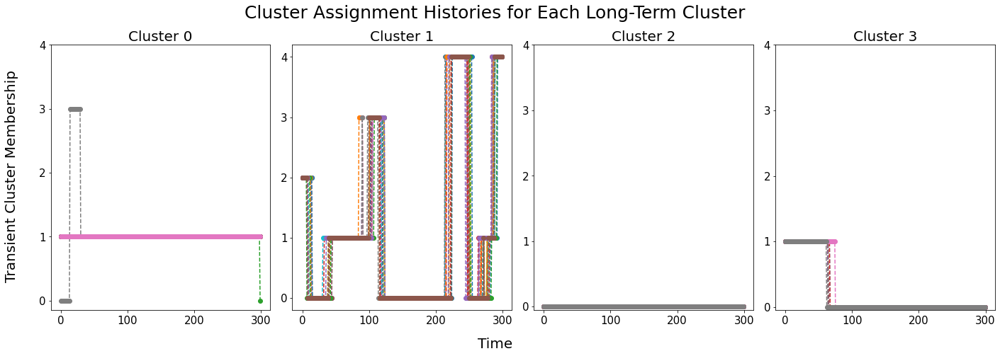

In [162]:
import matplotlib.pyplot as plt
from TKM_long_term_clusters import find_final_labels
pred_labels = find_final_labels(weights, k=k, all_labels = [], counts=[])

assignments = weights
assignments = np.where(assignments <0, k, assignments)

fig, axs = plt.subplots(1, k, figsize= (20,7))

for label in np.unique(pred_labels):
    members = np.where(pred_labels == label)[0]
    clust_histories = assignments[members, :]
    axs[int(label)].plot(clust_histories.T, '--o')
    axs[int(label)].set_yticks(ticks = np.unique(assignments))
    axs[int(label)].tick_params(axis = 'y', labelsize = 15)
    axs[int(label)].tick_params(axis = 'x', labelsize = 15)
    axs[int(label)].set_title('Cluster %d'%(int(label)), fontsize=20)

fig.suptitle('Cluster Assignment Histories for Each Long-Term Cluster', fontsize = 25)
fig.supxlabel('Time', fontsize = 20)
fig.supylabel('Transient Cluster Membership', fontsize = 20)
plt.tight_layout(rect=(0.025,0,1,1))
plt.savefig('agg_reynolds_300_71_histories.eps', format = 'eps')



In [86]:
print(full_ami, long_term_ami)


0.16732968800746204 0.6777814110116387


/Users/olgadorabiala/Documents/Thesis/tkm/perform_clustering.py:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


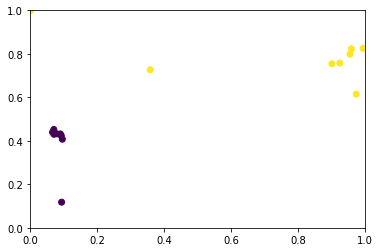

In [87]:
from perform_clustering import read_data, perform_clustering


data, tkm_data, true_labels = read_data(filename, min_size = 0, max_size = 100000)
from animate_path import animate_path

animate_path(tkm_data, agglo.labels.reshape((t,n)).T, anim_frames = t, anim_interval = 100)


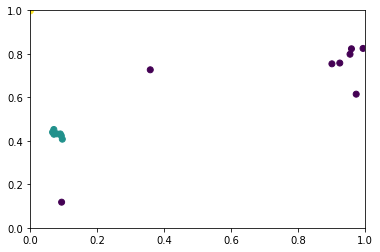

In [88]:
animate_path(tkm_data, np.tile(pred_labels, t).reshape((t,n)).T, anim_frames = t, anim_interval = 100)



In [7]:
# from sklearn.metrics import f1_score

# f1 = f1_score(np.tile(true_labels, t), (weights.T).reshape(t * n), average =None)
# print(long_term_ami, full_ami, f1)

In [94]:
from perform_clustering import read_data, perform_clustering


# filename = 'full_data/couzin_100_6.csv'
data, tkm_data, true_labels = read_data(filename, min_size = 0, max_size = 100000)
ami, tot_ami, runtime, weights = perform_clustering(tkm_data, true_labels, lam=.60, max_iter=5000)

assignments = np.argmax(weights, axis=2).T
print(ami, tot_ami)


/Users/olgadorabiala/Documents/Thesis/tkm/perform_clustering.py:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frame_data["id_cumcounts"] = frame_data.groupby("id").cumcount()
/opt/anaconda3/envs/tkm/lib/python3.9/site-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


Maximum number of iterations
0.5107675593281271 0.029830563711402143


In [95]:
n,t = assignments.shape
criteria_mat = similarity_matrix(assignments)

ltc = find_k_clusters(k=k, criteria_mat=criteria_mat, threshold_change=.05)

pred_labels = np.zeros(n)

for i, cluster in enumerate(ltc):
    pred_labels[cluster] = i



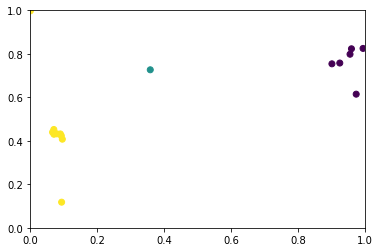

In [96]:
animate_path(tkm_data, assignments, anim_frames = t, anim_interval = 100)



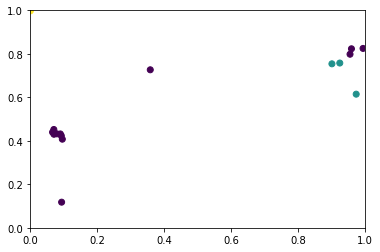

In [97]:
animate_path(tkm_data, np.tile(pred_labels, t).reshape((t,n)).T, anim_frames = t, anim_interval = 100)



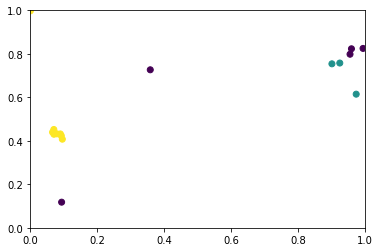

In [93]:
animate_path(tkm_data, np.tile(true_labels, t).reshape((t,n)).T, anim_frames = t, anim_interval = 100)

In [14]:
# t, m, n = tkm_data.shape
# k = len(np.unique(true_labels))
# for i in range(t):
#     print(assignments.reshape(t*n)[i*n:(i+1)*n])

In [15]:
from TKM_long_term_clusters import similarity_matrix, find_k_clusters


criteria_mat = similarity_matrix(weights)
ltc = find_k_clusters(k=k, criteria_mat=criteria_mat, threshold_change=.05, verbose=True)
pred_labels = np.zeros(n)

for i, cluster in enumerate(ltc):
    pred_labels[cluster] = i

ami = adjusted_mutual_info_score(true_labels, pred_labels)

print(ltc, '\n\n', pred_labels, '\n\n', true_labels, '\n\n', ami)


Could not find k clusters
[[0, 1, 2, 3, 4, 5], [6, 7, 10, 13, 14, 17, 18, 8, 9, 11, 12, 15, 16, 19, 21, 24, 32, 20, 26, 27, 28], [22, 23, 25, 33, 34, 35, 26, 27, 28, 31, 36], [29, 30], [37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49], [50, 51, 52, 53]] 

 [0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 2. 2.
 1. 2. 2. 2. 2. 3. 3. 2. 1. 2. 2. 2. 2. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4.
 4. 4. 5. 5. 5. 5.] 

 [0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4] 

 0.8303793676126072


In [28]:
from TKM_long_term_clusters import find_long_term_clusters

long_term_clusters = find_long_term_clusters(similarity_threshold=.70, criteria_mat=criteria_mat)
pred_labels = np.zeros(n)

for i, cluster in enumerate(long_term_clusters):
    pred_labels[cluster] = i
    
ami = adjusted_mutual_info_score(true_labels, pred_labels)

print(ami)

0.958602589647783


In [34]:
# from animate_path import animate_path

# animate_path(tkm_data, weights, anim_frames = t, anim_interval = 100)

In [35]:
for i in range(t):
    print((assignments.T).reshape(t * n)[i*n:n*(i+1)])

[4 4 4 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 0 0 0 0]
[4 4 4 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 0 0 0 0]
[4 4 4 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 0 0 0 0]
[4 4 4 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 0 0 0 0]
[4 4 4 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 0 0 0 0]
[4 4 4 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 0 0 0 0]
[4 4 4 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 0 0 0 0]
[4 4 4 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 0 0 0 0]
[4 4 4 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 0 0 0 0]
[4 4 4 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 0 0 0 0]
[4 4 4 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 0 0 0 0]
[4 4 4 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 0 0 0 0]
[4 4 4 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 0 0 0 0]
[4 4 4 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 0 0 0 0]
[4 4 4 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 0 0 0 0]
[4 4 4 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 0 0 0 0]
[4 4 4 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 0 0 0 0]
[4 4 4 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 0 0 0 0]
[4 4 4 2 2 2 3 3 3 3 3 3 3 3

In [20]:
true_labels

[0, 0, 0, 1, 2, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4]